# Assignment 3
## Diffusion Processes on Complex Networks

**Solutions by Kacper Kinastowski**

Implementation of random graphs and comparison with NetworkX built in:

In [1]:
import numpy as np
import networkx as nx
from matplotlib import pyplot as plt
import random

## random graph

def rand(N, p):
    vertices = range(N)
    G = nx.Graph()

    edge_list = []

    for i in range(len(vertices)):
        for j in range(len(vertices)):
            if random.random() < p:
                edge_list.append((i,j))
                
    G.add_edges_from(edge_list)
    
    return G

def draw(G):
    nx.draw(G, node_size = 5, alpha = 0.1)
    plt.show()

In [2]:
def graph_distribution_info(G, name):
    degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
    dmax = max(degree_sequence)
    davg = np.mean(degree_sequence)
    dvar = np.var(degree_sequence)
    
    print(f'Max Degree of a {name} = {dmax}')
    print(f'Average Degree of a {name} = {davg}')
    print(f'Variance of a Degree destribution = {dvar}')
    
    fig = plt.figure("Degree of a random graph", figsize=(8, 8))
    # Create a gridspec for adding subplots of different sizes
    axgrid = fig.add_gridspec(5, 4)

    ax0 = fig.add_subplot(axgrid[0:3, :])
    Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
    pos = nx.spring_layout(Gcc, seed=33)
    nx.draw_networkx_nodes(Gcc, pos, ax=ax0, node_size=5)
    nx.draw_networkx_edges(Gcc, pos, ax=ax0, alpha=0.1)
    ax0.set_title(f"Connected components of {name}")
    ax0.set_axis_off()

    ax1 = fig.add_subplot(axgrid[3:, :2])
    ax1.plot(degree_sequence, "b-", marker="o")
    ax1.set_title("Degree Rank Plot")
    ax1.set_ylabel("Degree")
    ax1.set_xlabel("Rank")
    
    ax2 = fig.add_subplot(axgrid[3:, 2:])
    ax2.bar(*np.unique(degree_sequence, return_counts=True))
    ax2.set_title("Degree histogram")
    ax2.set_xlabel("Degree")
    ax2.set_ylabel("# of Nodes")

    fig.tight_layout()
    plt.show()

In [3]:
G_rand = rand(2000, 0.2)

Max Degree of a random graph = 795
Average Degree of a random graph = 720.141
Variance of a Degree destribution = 485.353119


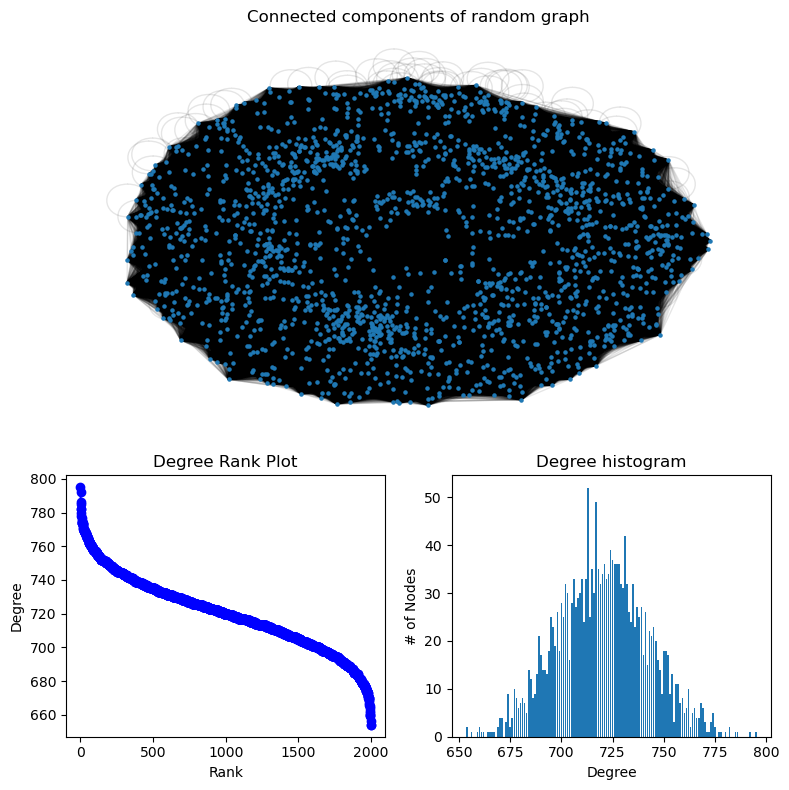

In [4]:
graph_distribution_info(G_rand, 'random graph')

## Random graph v2

Max Degree of a random graph = 61
Average Degree of a random graph = 40.2
Variance of a Degree destribution = 39.297


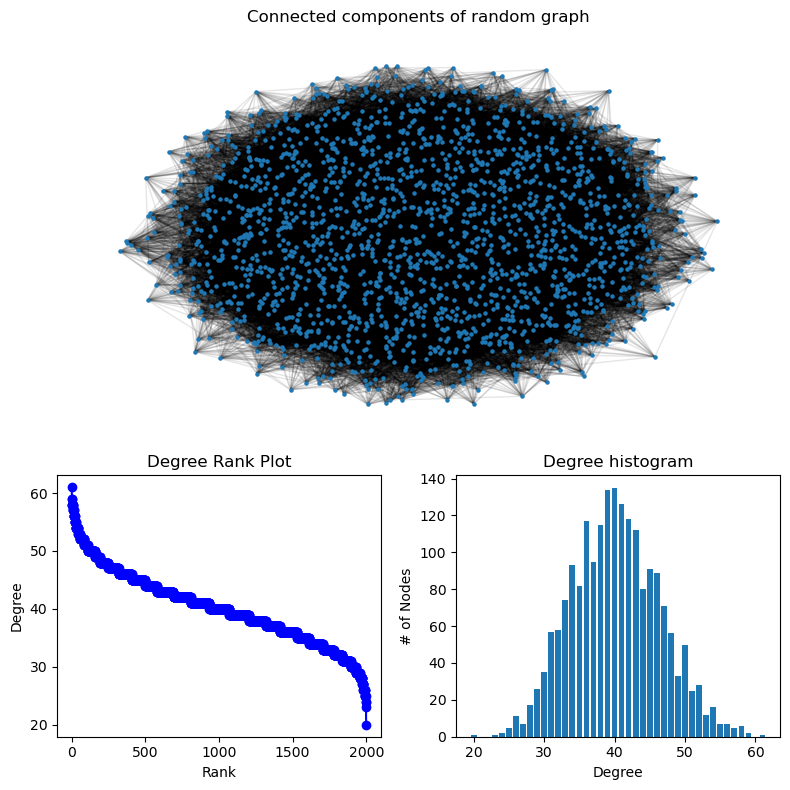

In [5]:
##random2 based on random adjacency matrix
def randomgraph2(N, p):
    graph = nx.Graph()
    
    adj = np.random.choice([0, 1], size = (N,N), p = [1-p, p])
    np.fill_diagonal(adj,0) #no self-loop
    
    graph = nx.from_numpy_array(adj)
    
    return graph

G = randomgraph2(2000, 0.01)
graph_distribution_info(G, 'random graph')

## Regular lattice graph

Max Degree of a rl = 6
Average Degree of a rl = 6.0
Variance of a Degree destribution = 0.0


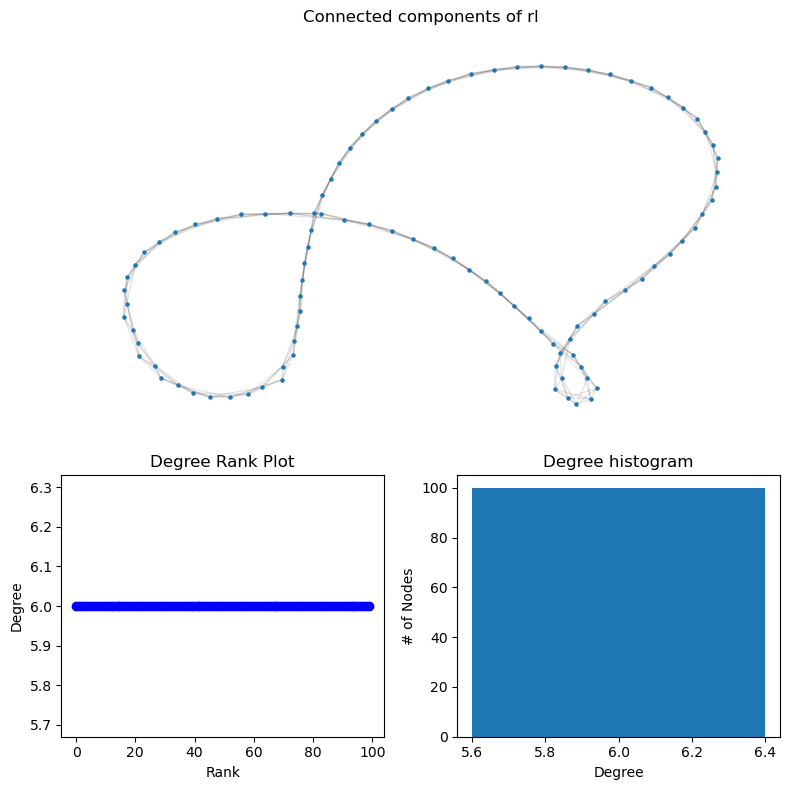

In [6]:
def regular_lattice_graph(N, k):
    nodes = list(range(N))
    graph = nx.Graph()
    
    for i in range(N):
        for j in range(1, k//2 + 1):
            graph.add_edge(i, (i+j)%N)
            graph.add_edge(i, (i-j)%N)
            
    return graph

rl = regular_lattice_graph(100, 6)
graph_distribution_info(rl, 'rl')

## Watts-Strogatz model

Max Degree of a rl = 8
Average Degree of a rl = 4.0
Variance of a Degree destribution = 1.439


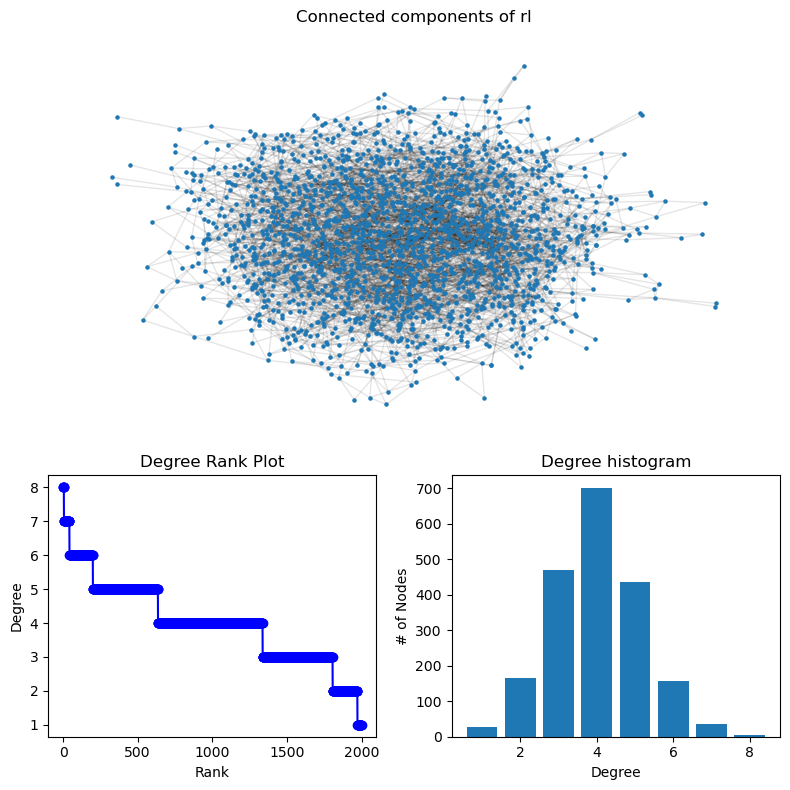

Max Degree of a rl = 7
Average Degree of a rl = 4.0
Variance of a Degree destribution = 0.699


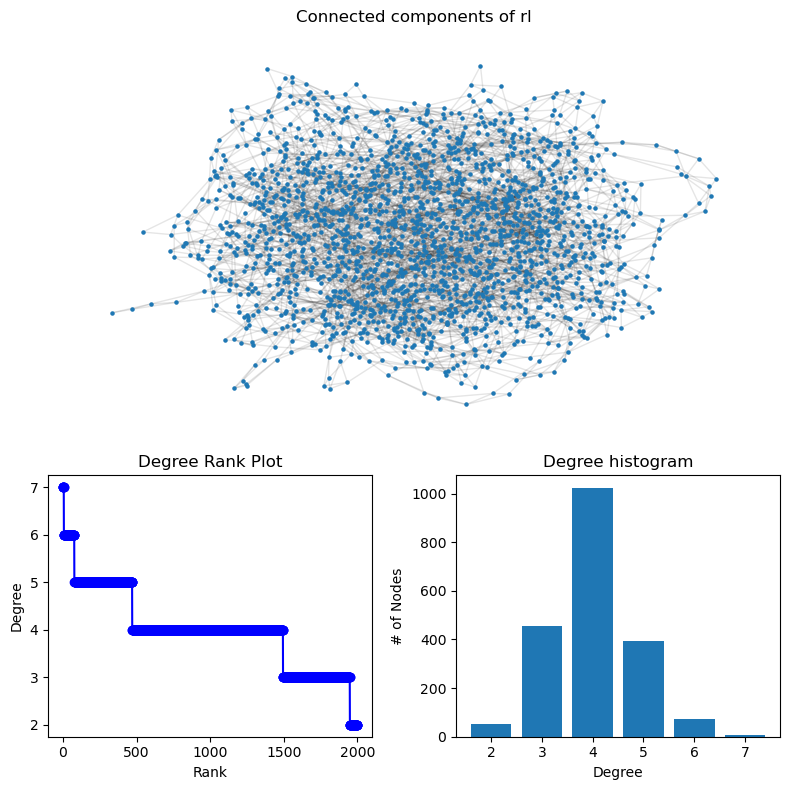

In [7]:
def watts_strogatz_graph(N, k, p):
    graph = regular_lattice_graph(N, k)
    
    for node in graph.nodes():
        for neighbor in list(graph.neighbors(node)):
            if random.random() < p:
                new_neighbor = random.choice(list(graph.nodes()))
                while new_neighbor in graph.neighbors(node) or new_neighbor == node:
                    new_neighbor = random.choice(list(graph.nodes()))
                graph.remove_edge(node, neighbor)
                graph.add_edge(node, new_neighbor)
        
    
    return graph

ws = watts_strogatz_graph(2000, 4, 0.2)
ws1 = nx.watts_strogatz_graph(2000, 4, 0.2)

graph_distribution_info(ws, 'rl')
graph_distribution_info(ws1, 'rl')

## Barabasi Alberts

Max Degree of a bal = 343
Average Degree of a bal = 39.6
Variance of a Degree destribution = 1178.418


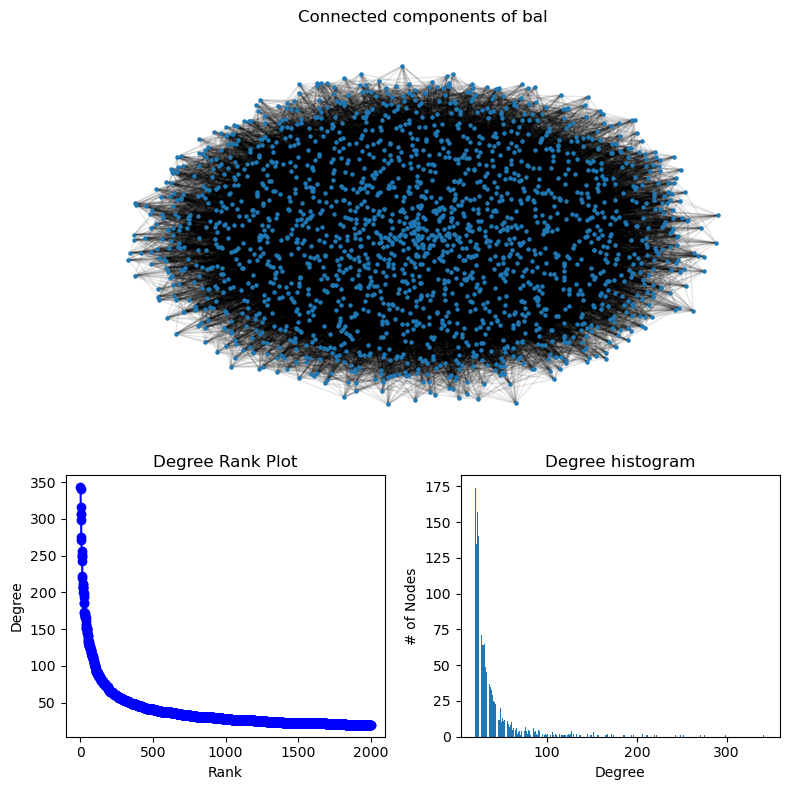

In [8]:
##networkx

ba1 = nx.barabasi_albert_graph(2000, 20)
graph_distribution_info(ba1, 'bal')

Max Degree of a ba = 321
Average Degree of a ba = 38.723
Variance of a Degree destribution = 1073.440271


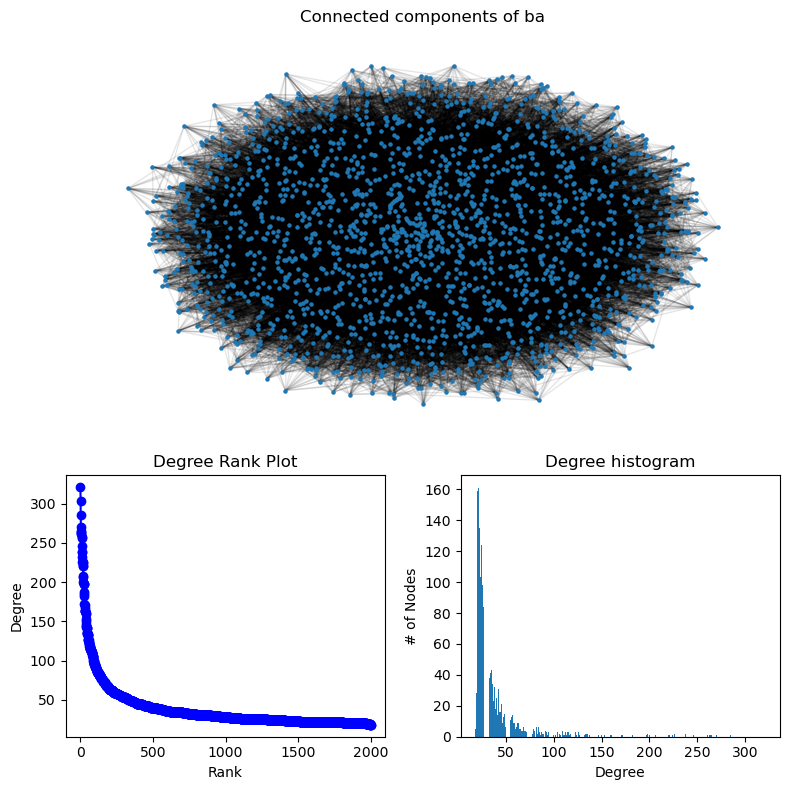

In [9]:
def barabasi_albert(n, m):
    """
    Generates a scale-free network using the Barabási-Albert model.

    :param n: The number of nodes in the graph.
    :param m: The number of edges to attach from a new node to existing nodes.
    :return: A NetworkX graph object representing a scale-free network.
    """
    # Initialize a graph with m+1 nodes.
    graph = nx.complete_graph(m+1)

    # Create the remaining n-m-1 nodes and add them to the graph.
    for i in range(m+1, n):
        # Choose m nodes at random from the existing nodes, with probability proportional to their degree.
        nodes = list(graph.nodes())
        probs = [graph.degree(node) for node in nodes]
        chosen = random.choices(nodes, weights=probs, k=m)
        # Add edges from the new node to the chosen nodes.
        for node in chosen:
            graph.add_edge(i, node)

    return graph

ba = barabasi_albert(2000, 20)
graph_distribution_info(ba, 'ba')

# Web scrapping part:

In [10]:
import pandas as pd
import praw
from prawcore.exceptions import Forbidden

# praw and reddit api
# YES, I know that's my password, it's just a test account to obtain reddit Open API
username = 'kacperekk6dev'
password = 'Nightcore67276!!'
user_agent = 'MaterialRecording160'
client_secret = 'Y7jjhPVqMVsJICK3MqcBfoZsFIiJzQ'
client_id = 'zvD9wlU3W8G74Fd_vq5YKA'

reddit = praw.Reddit(client_id=client_id,
                     client_secret=client_secret,
                     password=password,
                     user_agent=user_agent,
                     username=username)


class RedditTopUsersInfo:

    def __init__(self, subreddit_name, no_subreddit_posts=100, no_user_posts=10):
        self.subreddit_name = subreddit_name
        self.no_user_posts = no_user_posts
        self.no_subreddit_posts = no_subreddit_posts

    def get_top_posts_info(self, type='top'):
        """
        :param type:
        :return: pandas dataframe, returns post_info_dataframe with info based on top subreddit posts
        post_info_dataframe has 4 cols:
        1: 'id' - id of a post (str)
        2: 'author' - username (str)
        3: 'score' - no of up_votes (int)
        4: 'subreddit' - name of a subreddit that the submission was posted on (str)
         """
        subreddit = reddit.subreddit(self.subreddit_name)
        post_info = []
        for subm in subreddit.top(limit=self.no_subreddit_posts):
            subred_info = []
            subred_info.append(subm.id)
            subred_info.append(str(subm.author))
            subred_info.append(int(subm.score))
            subred_info.append(subm.subreddit)
            post_info.append(subred_info)
        post_info_sorted = sorted(post_info, key=lambda x: x[1], reverse=True)
        print(pd.DataFrame(post_info_sorted, columns=['id', 'author', 'score', 'subreddit']))
        return pd.DataFrame(post_info_sorted, columns=['id', 'author', 'score', 'subreddit'])

    def get_top_users_info(self, info=True):
        self.top_posts_info_df = self.get_top_posts_info()
        self.freq_authors = self.top_posts_info_df[self.top_posts_info_df.author != 'None']
        self.freq_authors = self.freq_authors['author']

        if info:
            print(f"Length of freq_authors =  {len(self.freq_authors.unique())}")
            print(self.freq_authors.unique())

        return self.freq_authors.unique()

    def get_users_post(self, username, number=10):
        user = reddit.redditor(username)
        user_comments_info = []
        for comment in user.comments.new(limit=number):
            user_comments_info.append(str(comment.id))
            user_comments_info.append(str(username))
            user_comments_info.append(int(comment.score))
            user_comments_info.append(str(comment.subreddit.display_name))

        user_posts_df = pd.DataFrame([(user_comments_info[i], user_comments_info[i + 2], user_comments_info[i + 1],
                                       user_comments_info[i + 3]) for i in range(0, len(user_comments_info), 4)],
                                     columns=['id', 'score', 'user_name', 'subreddit_name'])
        return user_posts_df

    def scrap_celebrities(self):
        usernames_list = self.get_top_users_info()
        df = pd.DataFrame()
        df = df.fillna(0)
        for author in usernames_list:
            try:
                temp = self.get_users_post(author, self.no_user_posts)
                print(temp)
                df = pd.concat([df, temp])
            except Forbidden:
                print(f'{author} account deleted or banned')
        print(df.info())
        print(df)
        return df
    

def scrap_df_to_nx(scrap_df):
    return nx.from_pandas_edgelist(scrap_df, source='user_name', target='subreddit_name')

def graph_visual(scrap_df, no_it=50, k_val=0.2, font_siz=15, name = 'Reddit connections', labels_bool = False):
    plt.figure(figsize=(30, 30))
    g = scrap_df_to_nx(scrap_df)
    gc = g.subgraph(sorted(nx.connected_components(g), key=len, reverse=True)[0])
    layout = nx.spring_layout(gc, k=k_val, iterations=no_it, scale=10)
    nx.draw(gc, layout, node_color='lime', node_size=190, with_labels=labels_bool, font_size=font_siz, alpha=0.5)
    plt.title(name)
    plt.savefig(f'{g}_visual.png')
    plt.show()
    plt.close()


def graph_distribution_info(scrap_df, name='Reddit connections degree info', log_scale = True):
    G = scrap_df_to_nx(scrap_df)
    degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
    dmax = max(degree_sequence)
    davg = np.mean(degree_sequence)
    dvar = np.var(degree_sequence)

    centrality = nx.betweenness_centrality(G)
    cent_list = [(x, round(centrality[x], 3)) for x in sorted(centrality, key=centrality.get, reverse=True)[:10]]

    print(f'Max Degree of a {name} = {dmax}')
    print(f'Average Degree of a {name} = {davg}')
    print(f'Variance of a Degree destribution = {dvar}')
    print(f'Top Celebrities:')
    print(cent_list)

    fig = plt.figure("Degree of a random graph", figsize=(8, 8))
    # Create a gridspec for adding subplots of different sizes
    axgrid = fig.add_gridspec(5, 4)

    ax0 = fig.add_subplot(axgrid[0:3, :])
    Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
    pos = nx.spring_layout(Gcc, seed=33)
    nx.draw_networkx_nodes(Gcc, pos, ax=ax0, node_size=5)
    nx.draw_networkx_edges(Gcc, pos, ax=ax0, alpha=0.1)
    ax0.set_title(f"Connected components of {name}")
    ax0.set_axis_off()

    ax1 = fig.add_subplot(axgrid[3:, :2])
    ax1.plot(degree_sequence, "b-", marker="o")
    ax1.set_title("Degree Rank Plot")
    ax1.set_ylabel("Degree")
    ax1.set_xlabel("Rank")
    if log_scale:
        ax1.set_xscale('log')
        ax1.set_yscale('log')

    ax2 = fig.add_subplot(axgrid[3:, 2:])
    ax2.bar(*np.unique(degree_sequence, return_counts=True))
    ax2.set_title("Degree histogram")
    ax2.set_xlabel("Degree")
    ax2.set_ylabel("# of Nodes")
    if log_scale:
        ax2.set_xscale('log')
        ax2.set_yscale('log')

    fig.tight_layout()
    plt.savefig(f'{G}_visual_info.png')
    plt.show()
    plt.close()

In [11]:
subreddit_name = 'Python'
mc = RedditTopUsersInfo(subreddit_name, no_subreddit_posts=1000, no_user_posts=4)
mc_df = mc.scrap_celebrities()

          id              author  score subreddit
0     op1tz0              zurtex   1275    Python
1    10zdidm              zurtex    930    Python
2     c1zx5f            zeus5552   1123    Python
3     gt5ups              zenalc   1233    Python
4     n6ecne             zecksss   1184    Python
..       ...                 ...    ...       ...
988   e0duk5              0rphon    887    Python
989   jui7zw          -sideshow-   3933    Python
990   qxeyrn          -sideshow-   2657    Python
991   h8ztdx        -_-qarmah-_-    713    Python
992   ciojde  --CreativeUsername   1397    Python

[993 rows x 4 columns]
Length of freq_authors =  785
['zurtex' 'zeus5552' 'zenalc' 'zecksss' 'young_boss27' 'yasoob_python'
 'yanni99' 'yangman_946' 'xxaabbeexx' 'wrtbwtrfasdf' 'wofl' 'woberto'
 'winner_godson' 'winchester6788' 'willm' 'willlingnesss' 'wdanilo'
 'vzakharov' 'vortex_ape' 'vorpalsmith' 'vcokltfre' 'vanyakosmos'
 'vaiv101' 'tymscar' 'tycooperaow' 'tthrivi' 'trollodel' 'trakBan131'
 

        id  score user_name subreddit_name
0  jhh88q4     12    zurtex         Python
1  jhfd82t      1    zurtex    MadeMeSmile
2  jhfd561      2    zurtex    MadeMeSmile
3  jhdz4g9      2    zurtex  blursedimages
        id  score user_name   subreddit_name
0  idshdww      1  zeus5552        AskReddit
1  iaejtnt      2  zeus5552  ProgrammerHumor
2  hrrbxgh      1  zeus5552        AskReddit
3  hcb36pe      1  zeus5552             meme
        id  score user_name subreddit_name
0  jejvsmt     14    zenalc       capybara
1  jb3fbpm      2    zenalc   newhampshire
2  jb3ebhz      2    zenalc   newhampshire
3  j9rorpb      3    zenalc       capybara
        id  score user_name subreddit_name
0  jf634u8     15   zecksss      Minecraft
1  je5kpbh      1   zecksss         tumblr
2  je4kage      1   zecksss  LeagueOfMemes
3  je1bxu2      1   zecksss          memes
        id  score     user_name         subreddit_name
0  jhy9fe5      2  young_boss27        ProgrammerHumor
1  j73t7n5      0  y

        id  score    user_name subreddit_name
0  jgutbp6      2  this_is_max         Python
1  jgut62n      6  this_is_max         Python
2  jgusxtf      3  this_is_max         Python
3  jgusomd      2  this_is_max         Python
        id  score          user_name   subreddit_name
0  ersuheh      0  thesameoldstories     sanfrancisco
1  eba58vq      1  thesameoldstories             pics
2  drhhgtn      1  thesameoldstories           Python
3  dr6m6gm      1  thesameoldstories  MachineLearning
        id  score     user_name subreddit_name
0  gfrijl6      0  theoracleguy     DesiDesire
1  fq7r4fv      1  theoracleguy         ukvisa
2  fq7ejtm      1  theoracleguy         ukvisa
3  fq7cjtl      1  theoracleguy         ukvisa
        id  score      user_name subreddit_name
0  jh2m6dm      2  themonsterpus  elasticsearch
1  jg92c0m      5  themonsterpus      giantbomb
2  jg8zmxt     22  themonsterpus      giantbomb
3  jf9jnzi     11  themonsterpus     nextlander
        id  score   user_

        id  score    user_name     subreddit_name
0  jhxfkn7      1  sohang-3112       RomanceBooks
1  jhw5xwb      1  sohang-3112  HistoricalRomance
2  jhw4gpa      3  sohang-3112       RomanceBooks
3  jhrhagj      1  sohang-3112        linux4noobs
        id  score       user_name         subreddit_name
0  jf7dvku      1  social_tech_10                 Python
1  jeufayr      4  social_tech_10  RASPBERRY_PI_PROJECTS
2  jcg5okg      1  social_tech_10  RASPBERRY_PI_PROJECTS
3  jbv9fic      3  social_tech_10             technology
        id  score user_name  subreddit_name
0  hw7zu2n      1   sn1pr0s  salesengineers
1  hw7zpz1      2   sn1pr0s  salesengineers
2  hw7zlxf      2   sn1pr0s  salesengineers
3  hw7zjjd      2   sn1pr0s  salesengineers
        id  score  user_name subreddit_name
0  j1sd976      3  slacka123       Military
1  iy3t515      1  slacka123    programming
2  iwd1ump      3  slacka123       politics
3  iup8pjt     10  slacka123            cpp
        id  score user_na

        id  score  user_name subreddit_name
0  jhizvep      5  rjtavares        ChatGPT
1  jgwgrdl      7  rjtavares         soccer
2  jgr79z8     10  rjtavares       portugal
3  jgda88p     19  rjtavares         soccer
        id  score   user_name subreddit_name
0  jemyarj     27  rherrmannr        ich_iel
1  j7osoo0      6  rherrmannr        600euro
2  j7hv8mr      1  rherrmannr          DotA2
3  j6kkuxl      1  rherrmannr     linuxmemes
        id  score  user_name subreddit_name
0  jhjjr3d      1  reforitor       IOENepal
1  jhjj0vy      3  reforitor       IOENepal
2  jhjibkw      3  reforitor       IOENepal
3  jggyjqh      1  reforitor       IOENepal
        id  score          user_name      subreddit_name
0  j26q4lz      2  reeeeeee475747383  u_pixiecatofficial
1  iy16jp5      1  reeeeeee475747383          LegalTeens
2  ixmw46w      1  reeeeeee475747383           BBWHentai
3  ixf3dpg      1  reeeeeee475747383           cumfetish
        id  score  user_name      subreddit_name
0

        id  score   user_name subreddit_name
0  i9b4kz4      1  peterlravn       HalfLife
1  huyrvaz      3  peterlravn           xmen
2  huyriix      3  peterlravn           xmen
3  huumraz     30  peterlravn   AnarchyChess
        id  score user_name subreddit_name
0  jgni0fs      1    pdwp90           BBBY
1  jgn6z5u      1    pdwp90           BBBY
2  jgmcmts      3    pdwp90           BBBY
3  jgmck5d      9    pdwp90           BBBY
        id  score user_name subreddit_name
0  j6zvybu      4  pd-spark  nbadiscussion
1  ivwqo67      2  pd-spark       Peptides
2  i5fm47t      5  pd-spark     VintageNBA
3  i48h40n      2  pd-spark     VintageNBA
        id  score user_name  subreddit_name
0  jgrv9kb      6  pcvision  porterrobinson
1  jgn1cuq     47  pcvision             EDM
2  jd8ydds      2  pcvision           godot
3  jcpygvl      2  pcvision        Wevolver
        id  score   user_name       subreddit_name
0  gqkkrns     21  paulkaefer  InternetIsBeautiful
1  ghzvk77      6  paul

mutatedllama account deleted or banned
        id  score    user_name subreddit_name
0  ims700z      1  mshoaib9711          dubai
1  i56tg5s    340  mshoaib9711          dubai
2  hsvkm0p     38  mshoaib9711          dubai
3  hom8gi8    120  mshoaib9711     animememes
        id  score  user_name subreddit_name
0  jgbsnvw      1  mrgadgety          nreal
1  jdzd53s      1  mrgadgety      SteamDeck
2  jd6hmfx      2  mrgadgety      SteamDeck
3  jct3zc8      3  mrgadgety      SteamDeck
        id  score   user_name   subreddit_name
0  h96g8w3      3  mrborgen86       javascript
1  h10y1w7      2  mrborgen86  learnjavascript
2  gzj4619      1  mrborgen86  learnjavascript
3  gz1uhdt      2  mrborgen86  learnjavascript
        id  score  user_name      subreddit_name
0  jen068v     26  mountwebs   AnimalsBeingDerps
1  j9j3dz4      3  mountwebs          bouldering
2  j59x1ey      3  mountwebs  ContagiousLaughter
3  ixyz1v3      1  mountwebs            puredata
        id  score  user_name   

        id  score user_name subreddit_name
0  etujnod      2   llfcerf         Python
1  ekpn7rz      1   llfcerf       embedded
2  eh3y0sd      1   llfcerf         Python
3  eh3h836      1   llfcerf         Python
        id  score    user_name subreddit_name
0  j8d3csi      1  linuxfarmer   ledgerwallet
1  j825cja      1  linuxfarmer           Nexo
2  j8255tv     -1  linuxfarmer           Nexo
3  j6kg1wj      1  linuxfarmer         webdev
        id  score user_name  subreddit_name
0  fpq480u      1    lhad89  battlestations
1  focx20y      2    lhad89         todoist
2  fnxx932      2    lhad89         todoist
3  fnknyh3      2    lhad89         todoist
        id  score   user_name subreddit_name
0  jcvqtvv     67  lexfridman     lexfridman
1  jaey0in      7  lexfridman     lexfridman
2  jaaolke     23  lexfridman     lexfridman
3  jaao7nj     31  lexfridman     lexfridman
        id  score   user_name subreddit_name
0  jghpd8q      2  lerrigatto          italy
1  jfbnenm      2  l

        id  score    user_name subreddit_name
0  g1vqlkq     -1  joshiemoore            rit
1  g1tfrop     -7  joshiemoore            rit
2  g1t3siu      0  joshiemoore            rit
3  g1t376l     -5  joshiemoore            rit
        id  score       user_name   subreddit_name
0  io84752      1  joris_limonier  GoogleAnalytics
1  ihb9g6b      1  joris_limonier  GoogleAnalytics
2  ighuw2u      1  joris_limonier  GoogleAnalytics
3  icyq15y      1  joris_limonier        freelance
        id  score       user_name  subreddit_name
0  jhuagit      1  jonathanbesomi           memes
1  jhkvrvv      1  jonathanbesomi       legaltech
2  je4tdd8      1  jonathanbesomi      opensource
3  jdvkevw      1  jonathanbesomi  computervision
        id  score          user_name    subreddit_name
0  jh0io9x      7  jonathan_fortmann  SpaceXMasterrace
1  jh0i7i9      2  jonathan_fortmann  SpaceXMasterrace
2  jgdz85m      6  jonathan_fortmann  SpaceXMasterrace
3  jg44gxz      1  jonathan_fortmann    curse

        id  score             user_name subreddit_name
0  jh8bg72      1  import-username-as-u     FlutterDev
1  jg8ifu5      4  import-username-as-u     FlutterDev
2  jg8hh3q      1  import-username-as-u     FlutterDev
3  jg8fclf      1  import-username-as-u     FlutterDev
imakethingswhenbored account deleted or banned
        id  score           user_name subreddit_name
0  h1002da      1  imaginary_rational         Python
1  h0zztim      2  imaginary_rational         Python
2  h0zycgo      1  imaginary_rational         Python
3  h0vpvuw      2  imaginary_rational         Python
        id  score user_name subreddit_name
0  jhmijhi      2    ikkebr         brasil
1  jhcaob6     17    ikkebr     brasilivre
2  jh8no2r      1    ikkebr     brasilivre
3  jgknwh0      2    ikkebr        Calgary
        id  score       user_name   subreddit_name
0  gx8vihy     33  ijustwannacode  ExperiencedDevs
1  gny0shz      1  ijustwannacode   AskProgramming
2  gnv5uli      2  ijustwannacode   AskProgra

        id  score      user_name  subreddit_name
0  g9o1two      1  godblesspiggy  RedditSessions
1  fljh6na      4  godblesspiggy     Coronavirus
2  fh6ze0j      3  godblesspiggy        fujifilm
3  fh6zcig     13  godblesspiggy        fujifilm
        id  score user_name subreddit_name
0  j9reh0r      2     gnurd         Python
1  j9ky30t      1     gnurd         Python
2  j9kukfu      1     gnurd         Python
3  j9ksbkz      1     gnurd         Python
        id  score       user_name     subreddit_name
0  jbcely8      1  glum-platimium  Hacking_Tutorials
1  jb0izmx      1  glum-platimium            ChatGPT
2  jazcupi     -1  glum-platimium  Hacking_Tutorials
3  jazcsnl      1  glum-platimium            ChatGPT
        id  score    user_name subreddit_name
0  jdtqrjl     46  gimmeapples         webdev
1  jdtmg97      9  gimmeapples         webdev
2  jdtmblc      6  gimmeapples         webdev
3  jdt7lq5      1  gimmeapples         webdev
        id  score       user_name subreddit_n

        id  score    user_name   subreddit_name
0  jhkn2zd      1  dusktreader             pics
1  jgry115      1  dusktreader       Unexpected
2  jgpkqxc     42  dusktreader         Seahawks
3  jg1d3mm      1  dusktreader  ProgrammerHumor
        id  score    user_name  subreddit_name
0  j2ymmga      2  dumblechode          Python
1  j2kwfz4      2  dumblechode          Python
2  i0f3c3d      1  dumblechode  bioinformatics
3  hkq7ych      2  dumblechode            UofT
        id  score user_name subreddit_name
0  jax5lan     -6  dulldata            SEO
1  jax5jpw      1  dulldata            SEO
2  jax42zp     -5  dulldata            SEO
3  jax2b90      1  dulldata            SEO
        id  score   user_name subreddit_name
0  j419owb      2  driscollis         Python
1  hrnvp13      1  driscollis         Python
2  hop82gx      1  driscollis         videos
3  hi0gdtl      2  driscollis         Python
        id  score    user_name     subreddit_name
0  e4q5ycg      1  donnemartin     

        id  score  user_name subreddit_name
0  jhlhqj0      1  corey4005       facepalm
1  jhebi0j      1  corey4005     GradSchool
2  jg53bhh      2  corey4005     GradSchool
3  jffurv4      2  corey4005     GradSchool
        id  score      user_name subreddit_name
0  jft5up7      1  coolmanreebro     OstrivGame
1  j5e9wc0      1  coolmanreebro  tipofmytongue
2  j5e8i64      1  coolmanreebro  urbanplanning
3  icczp5e      1  coolmanreebro  tipofmytongue
        id  score            user_name  subreddit_name
0  i48d64t      1  cookedsashimipotato       Surveying
1  i35n6mi      1  cookedsashimipotato       Surveying
2  i35n232      1  cookedsashimipotato       Surveying
3  hxr3e88      1  cookedsashimipotato  photogrammetry
        id  score user_name subreddit_name
0  jg3q291      2  conoroha      CarTalkUK
1  jg0oz9h      1  conoroha      CarTalkUK
2  jfzpwba      3  conoroha      CarTalkUK
3  hxgi5we      2  conoroha   raspberry_pi
        id  score    user_name subreddit_name
0  j

        id  score     user_name    subreddit_name
0  eruy13v    217  bad-buddhist     gameofthrones
1  e9m8o4u      2  bad-buddhist        web_design
2  e8aqviz      2  bad-buddhist       AmazonMerch
3  e2hl4i6      1  bad-buddhist  identifythisfont
        id  score   user_name subreddit_name
0  jdktbb6      1  backprop88      cofounder
1  j2ppwe2      1  backprop88     Nootropics
2  j2p1cvx      1  backprop88     Nootropics
3  j2cb8pp      1  backprop88     Nootropics
        id  score  user_name  subreddit_name
0  j1qhapu      1  azidified         hacking
1  j0cmrvd      1  azidified  netsecstudents
2  j01jvot      1  azidified             CEH
3  iyrrj8h     14  azidified       tryhackme
        id  score user_name        subreddit_name
0  jhqav5h      3  azhenley  ProgrammingLanguages
1  jha8bpv      8  azhenley  ProgrammingLanguages
2  j9i9by0      1  azhenley                  lego
3  j87fqp9      4  azhenley                   PhD
        id  score  user_name subreddit_name
0  ipp

        id  score    user_name        subreddit_name
0  hxa4rkv      9  abbaadmasri  KidsAreFuckingStupid
1  hwsjhxf      1  abbaadmasri             TwoXIndia
2  hv5jga9      2  abbaadmasri            SaimanSays
3  hv4mjj5      1  abbaadmasri            SaimanSays
        id  score   user_name subreddit_name
0  jbrqg9o      1  aaronpenne     generative
1  ja9shvg      3  aaronpenne     generative
2  ja9r2kj      1  aaronpenne     generative
3  j4rpirn      1  aaronpenne     generative
        id  score      user_name subreddit_name
0  gb4nvww     17  aabhusanaryal        Bitcoin
1  gb2sgi8      1  aabhusanaryal        Bitcoin
2  gb0gmm0      1  aabhusanaryal          vuejs
3  gazobot      1  aabhusanaryal        Bitcoin
        id  score user_name subreddit_name
0  g6xv9nc      1  aa_y_ush         Python
1  fhotxi5     -1  aa_y_ush    programming
2  fgo3noh      1  aa_y_ush         Python
3  fgljjyc      1  aa_y_ush         Python
        id  score           user_name subreddit_name
0 

        id  score   user_name subreddit_name
0  hw8z2qp      1  The_Regent        haskell
1  hivpfo9      2  The_Regent           lisp
2  hiu2yni      1  The_Regent           lisp
3  h7i4kjq      2  The_Regent           rust
TheJizzWiz account deleted or banned
        id  score     user_name subreddit_name
0  jhihi5g      1  TheInsaneApp   TheInsaneApp
1  jgqsbhd      2  TheInsaneApp   TheInsaneApp
2  jgd2ej6      2  TheInsaneApp   TheInsaneApp
3  jg8d87y      1  TheInsaneApp   TheInsaneApp
        id  score       user_name     subreddit_name
0  jex05mc      1  TheHouseofReps     MinecraftMemes
1  jaf2jyc      1  TheHouseofReps    ProgrammerHumor
2  j727ek9    214  TheHouseofReps  interestingasfuck
3  j3jvxth     11  TheHouseofReps      Wellthatsucks
        id  score     user_name  subreddit_name
0  jhwjvtg      2  TheHostThing    Warhammer40k
1  jhu70m6      2  TheHostThing         40kLore
2  jhipl4b      1  TheHostThing            food
3  jhdejtx      2  TheHostThing  fantasywriter

        id  score user_name subreddit_name
0  iyfgcdy      2  SexyYear     Superstonk
1  iyexse4      3  SexyYear     Superstonk
2  iyexr1l      1  SexyYear     Superstonk
3  iyexnw7      2  SexyYear     Superstonk
        id  score user_name  subreddit_name
0  j7v0hni      1   Sergpan      breadboard
1  j7quo4w      1   Sergpan  diyelectronics
2  j0yf6fz      1   Sergpan         startup
3  iwmo4mf      1   Sergpan      breadboard
        id  score      user_name   subreddit_name
0  jcy4c9b      1  SensibleJames  ProgrammerHumor
1  jb4dxdq      1  SensibleJames            vuejs
2  jb0mitp      7  SensibleJames            vuejs
3  jatjje3      2  SensibleJames  ProgrammerHumor
        id  score user_name     subreddit_name
0  jg8h8zs      1    Seitoh          AskFrance
1  jg76mbt      3    Seitoh  cellular_automata
2  jg49srs      6    Seitoh  cellular_automata
3  jf1dfcz      1    Seitoh  cellular_automata
        id  score user_name subreddit_name
0  jgumlrp      4   Sebaron    progra

Paradoggs account deleted or banned
        id  score      user_name   subreddit_name
0  g42q7f9      0  Pappa--Stalin            space
1  g42hyp8      2  Pappa--Stalin        copypasta
2  fqn6vir      6  Pappa--Stalin    blursedimages
3  fndh89x      2  Pappa--Stalin  dataisbeautiful
        id  score user_name subreddit_name
0  g8p174s      2   PR0T064         Python
1  fs8fmkj      1   PR0T064         Python
2  frvo0uw      2   PR0T064         Python
3  frufx94      1   PR0T064         Python
P4TR10T_03 account deleted or banned
        id  score    user_name        subreddit_name
0  ittl3qm      2  OutOfTempo_  cscareerquestionsOCE
1  ittjg7z      3  OutOfTempo_       ProgrammerHumor
2  ismz2sr      1  OutOfTempo_               PlateUp
3  ismnqut      7  OutOfTempo_   technicallythetruth
Empty DataFrame
Columns: [id, score, user_name, subreddit_name]
Index: []
        id  score        user_name subreddit_name
0  j56l9qx      1  OpinionsRstupid        scabies
1  j4mroiw      1  Opin

        id  score      user_name   subreddit_name
0  icafhji      1  Marvelman3284  ProgrammerHumor
1  ic9x25k      1  Marvelman3284        AskReddit
2  i2xuehb      1  Marvelman3284        AskReddit
3  hvv0pfx      1  Marvelman3284  ProgrammerHumor
        id  score   user_name     subreddit_name
0  fwrybix      1  MarkMichon            chicago
1  fwrwzvf      1  MarkMichon            chicago
2  fwrwswt      4  MarkMichon            chicago
3  fj8cll7      1  MarkMichon  cscareerquestions
        id  score         user_name subreddit_name
0  g88ksup      0  MarinaChatterjee         Python
1  g6bt3gd      1  MarinaChatterjee     pythontips
        id  score user_name subreddit_name
0  hk52o9w      1   Marc_B7    LifeProTips
1  hizuujb      3   Marc_B7      runescape
2  h26ywgl      2   Marc_B7      runescape
3  fgsme0m      1   Marc_B7            css
        id  score  user_name subreddit_name
0  ieu0nrz      1  MarasTomi   pcmasterrace
1  ial7v5h      3  MarasTomi       unixporn
2  ia

        id  score user_name subreddit_name
0  j0burcm      1     JZOSS        RStudio
1  iy81o40      1     JZOSS         rstats
2  iw77g7f      1     JZOSS       Database
3  iw77511      1     JZOSS       Database
        id  score  user_name subreddit_name
0  jhywoef      3  JO3POTATO     LynnwoodWA
1  jhqhqym      5  JO3POTATO    billsimmons
2  jhmdpql      4  JO3POTATO            nba
3  jhmdpc4      1  JO3POTATO            nba
        id  score  user_name subreddit_name
0  itryjfj      4  Itwist101           UofT
1  itrxyre      3  Itwist101           UofT
2  irfnzki      2  Itwist101           UofT
3  ikwfnvt      7  Itwist101           UofT
        id  score            user_name subreddit_name
0  j808cq2      1  ItsTheWeeBabySeamus       PngTuber
1  j7w2yoi      2  ItsTheWeeBabySeamus       PngTuber
2  j7sgbcm      1  ItsTheWeeBabySeamus           GPT3
3  j758896      3  ItsTheWeeBabySeamus           GPT3
        id  score      user_name subreddit_name
0  jdb82qu      5  Importan

        id  score     user_name subreddit_name
0  jht9eom     11  FlyingCow343   combinedgifs
1  jhlqab3      5  FlyingCow343         tumblr
2  jhjwi82      1  FlyingCow343       Terraria
3  jhjlduc      1  FlyingCow343       Terraria
FliteSchool account deleted or banned
        id  score     user_name    subreddit_name
0  jhrh1yu      2  Fisherman386           isopods
1  jhpqvaz      2  Fisherman386           insects
2  jhovapq      4  Fisherman386           insects
3  jgmwulp      1  Fisherman386  mildyinteresting
        id  score    user_name  subreddit_name
0  i9fysrp     16  FisherGuy44  CryptoCurrency
1  hz0zcqg      4  FisherGuy44          netsec
2  h38nt5j     -1  FisherGuy44     programming
3  gwa80h2      3  FisherGuy44           linux
Fengax account deleted or banned
        id  score    user_name subreddit_name
0  jhwzp25      3  Felixca1100       Illenium
1  jhww8cj      3  Felixca1100       Illenium
2  jhwvtaz      7  Felixca1100       Illenium
3  jh7yaxg      6  Felixc

        id  score   user_name   subreddit_name
0  jf1gca3      1  Cool_doggy        3dspiracy
1  j43fqrz      1  Cool_doggy  ProgrammerHumor
2  j41dfna      5  Cool_doggy  ProgrammerHumor
3  j3yyrxo      0  Cool_doggy  ProgrammerHumor
        id  score             user_name subreddit_name
0  j6l6ecl      1  Competitive-Doubt298        gamedev
1  j6l645u      1  Competitive-Doubt298        gamedev
2  j6l5xht      1  Competitive-Doubt298           csgo
3  j6l5uiz      1  Competitive-Doubt298        Unity3D
        id  score            user_name subreddit_name
0  jeo61a6      2  Comfortable-Ad-2379   snowboarding
1  ivo5nxw     -3  Comfortable-Ad-2379       DCcomics
2  iv4vszj      2  Comfortable-Ad-2379       DCcomics
3  iv4uuwr      2  Comfortable-Ad-2379       DCcomics
        id  score  user_name subreddit_name
0  jgsf1tx     37  CodyAbode       RimWorld
1  jg3mlrq      1  CodyAbode         nvidia
2  j86oq4g      1  CodyAbode         BoltEV
3  j85g291      2  CodyAbode         BoltEV


        id  score  user_name subreddit_name
0  jh2wjjg     15  Altec5280            UBC
1  jh2gzlm     39  Altec5280            UBC
2  jgtis8m      1  Altec5280            UBC
3  jexlg24      1  Altec5280            UBC
        id  score         user_name   subreddit_name
0  jggbywe      1  AlrikBunseheimer  ProgrammerHumor
1  jgdncxf      8  AlrikBunseheimer           berlin
2  jgdmuhl      1  AlrikBunseheimer  ProgrammerHumor
3  jgdiwzu      1  AlrikBunseheimer          Studium
        id  score           user_name subreddit_name
0  jhygbz1     32  Alexanderdaawesome       JoeRogan
1  jhydqqm      4  Alexanderdaawesome       JoeRogan
2  jhy601w      2  Alexanderdaawesome   RocketLeague
3  jhtanvd      2  Alexanderdaawesome       JoeRogan
        id  score      user_name   subreddit_name
0  j7x54a9      1  AlanCristhian  ProgrammerHumor
1  j7x4fct      3  AlanCristhian  ProgrammerHumor
2  j6trmmp      1  AlanCristhian  ProgrammerHumor
3  j6tqgeq     30  AlanCristhian  ProgrammerHumor


In [12]:
mc_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3015 entries, 0 to 3
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              3015 non-null   object
 1   score           3015 non-null   object
 2   user_name       3015 non-null   object
 3   subreddit_name  3015 non-null   object
dtypes: object(4)
memory usage: 117.8+ KB


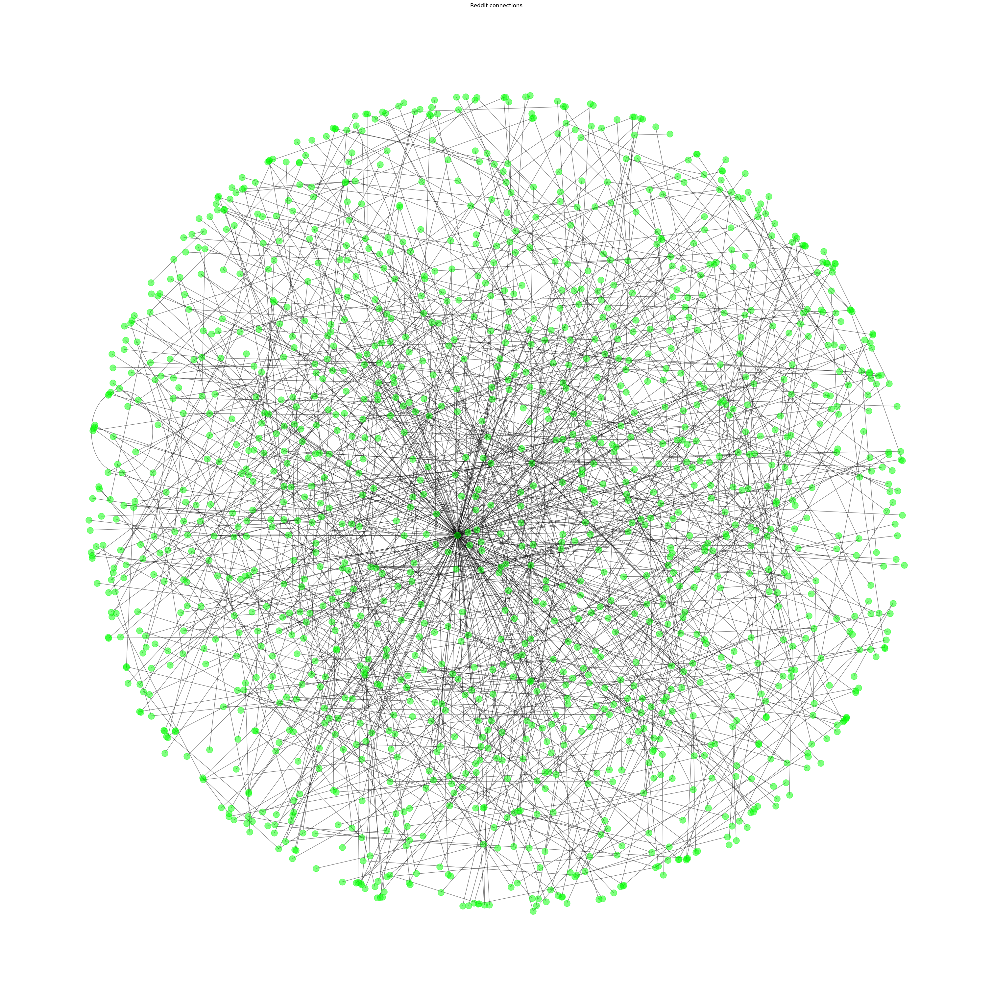

In [13]:
graph_visual(mc_df, no_it=250, k_val=0.9, font_siz=11)

Max Degree of a Reddit/Python connections degree info = 147
Average Degree of a Reddit/Python connections degree info = 2.02258726899384
Variance of a Degree destribution = 13.717148952856409
Top Celebrities:
[('Python', 0.327), ('ProgrammerHumor', 0.084), ('learnpython', 0.071), ('AskReddit', 0.067), ('programming', 0.034), ('memes', 0.033), ('ChatGPT', 0.03), ('dataisbeautiful', 0.029), ('vaiv101', 0.029), ('MachineLearning', 0.028)]


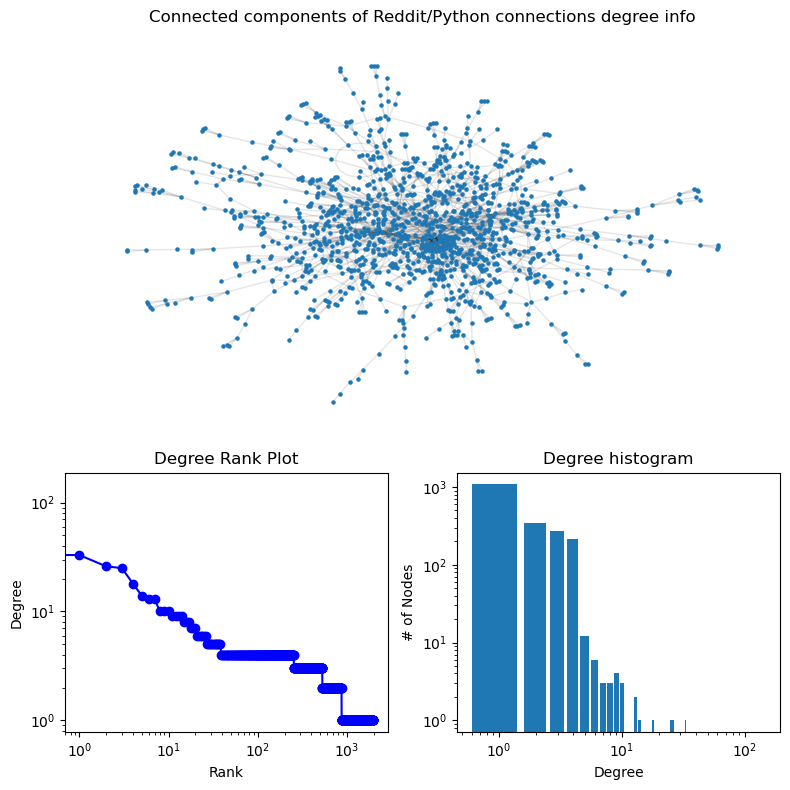

In [14]:
graph_distribution_info(mc_df, name= 'Reddit/Python connections degree info', log_scale = True)

In [ ]:
subreddit_name_2 = 'Gaming'
rui = RedditTopUsersInfo(subreddit_name_2, no_subreddit_posts=1000, no_user_posts=5)
rui_df = rui.scrap_celebrities()
graph_visual(rui_df, no_it=250, k_val=0.9, font_siz=11)
graph_distribution_info(rui_df, name= 'Reddit/Gaming connections degree info', log_scale = True)